# 03c — The augmentation-invariance eval (Family B)

**Phase 1.5, notebook 3 of 5.**

In `03a` we identified augmentation as one of three workaround families for the missing-labels problem, and in `03b` we built the metrics. This notebook puts those two together: the **first complete eval task** for LUKI.

By the end you will:
1. Understand exactly what augmentation invariance does and *doesn't* test.
2. See an empirical breakdown of how DINOv3 handles four kinds of perturbation.
3. Know how to defend the circularity objection (an interviewer *will* raise it).
4. **Distinguish two competing hypotheses with a designed experiment** — a senior-track move.
5. Have augmentation code ready to lift into `src/luki/eval/augment.py`.

---

## Refresher — what self-supervised learning actually optimizes

Most ML you've seen is **supervised**: a label tells the model what each image *is*. Self-supervised learning has no labels. So what gradient signal pushes the weights?

**The trick**: take a photo, apply two different augmentations to it, push the resulting two embeddings *together*. Take a different photo, push its embedding *away* from the first. The only invariant under those augmentations is *what's actually in the image* — so the model learns to encode that.

DINOv3's official augmentation pipeline (verified from `dinov3/data/augmentations.py` in [facebookresearch/dinov3](https://github.com/facebookresearch/dinov3)) is:
1. `RandomResizedCrop` (geometric)
2. `RandomHorizontalFlip` *(this is the **only** geometric transform — flip, not arbitrary rotation)*
3. `ColorJitter`
4. `RandomGrayscale`
5. `GaussianBlur`
6. `RandomSolarize`
7. `Normalization`

**No arbitrary rotation.** That's the lever. If we test rotation, we test something *outside* the training distribution — how DINOv3 handles it is informative about generalisation, not about its training objective.

**The eval contract for this notebook**: for each photo $p$, we apply augmentation $a$ and search the corpus with the augmented image. The relevance label is binary and trivially defined: the **original $p$** is the only relevant doc. Every other photo in the corpus is irrelevant. This is the cleanest eval contract we'll meet — no proxy biases, no judgment calls.

**The catch**: it tests invariance to *the augmentations you chose*. A model that nails grayscale but fails on real-world variation (different lighting, weather) would still score perfectly here. So the result is a **necessary-but-not-sufficient** sanity check.

## Setup

In [12]:
from __future__ import annotations

import sys
from pathlib import Path

REPO = Path().resolve().parent
sys.path.insert(0, str(REPO / "src"))

import io, base64
from typing import Callable

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageOps, ImageEnhance
from IPython.display import display, HTML

from luki.api import services
from luki.embeddings.dataset import load_image, resolve_path
from luki.eval.metrics import recall_at_k, reciprocal_rank, bootstrap_ci

manifest = pd.read_parquet(REPO / "data" / "processed" / "manifest.parquet")
RAW_DIR  = REPO / "data" / "raw"
store    = services.get_store()
embedder = services.get_embedder()
print(f"{len(manifest)} photos, {store.count()} Qdrant points")

SEED = 42  # one seed for the whole notebook → bit-exact reproducibility

205 photos, 205 Qdrant points


## The four augmentations

Each is a deterministic function `(image, rng) → image`. The `rng` argument is non-optional even when there's no randomness — uniform interface lets the eval runner treat them all the same.

| Augmentation | What it perturbs | DINOv3 trained on it? | Predicted difficulty |
|---|---|---|---|
| `grayscale` | colour | yes (RandomGrayscale) | very easy |
| `random_crop` | spatial | yes (RandomResizedCrop, heavily) | very easy |
| `brightness_jitter` | photometry | yes (ColorJitter) | easy |
| `rotate` | geometry | **no — only horizontal flip is in the pipeline** | **predicted hardest** |

Form a hypothesis *before* running: rotate dominates the failure modes. If the data agrees, the model behaves as predicted. If it doesn't, that disagreement is itself a result worth interrogating.

In [13]:
def aug_grayscale(img: Image.Image, rng: np.random.Generator) -> Image.Image:
    return ImageOps.grayscale(img).convert("RGB")

def aug_random_crop(img: Image.Image, rng: np.random.Generator, ratio: float = 0.7) -> Image.Image:
    w, h = img.size
    cw, ch = int(w * ratio), int(h * ratio)
    x = int(rng.integers(0, w - cw + 1))
    y = int(rng.integers(0, h - ch + 1))
    return img.crop((x, y, x + cw, y + ch))

def aug_brightness_jitter(img: Image.Image, rng: np.random.Generator) -> Image.Image:
    factor = float(rng.uniform(0.6, 1.4))   # ±40% — within typical SSL training range
    return ImageEnhance.Brightness(img).enhance(factor)

def aug_rotate(img: Image.Image, rng: np.random.Generator) -> Image.Image:
    angle = float(rng.uniform(-30, 30))     # ±30° — hard but not absurd
    return img.rotate(angle, expand=False)

AUGMENTATIONS: dict[str, Callable] = {
    "grayscale":  aug_grayscale,
    "crop":       aug_random_crop,
    "brightness": aug_brightness_jitter,
    "rotate":     aug_rotate,
}


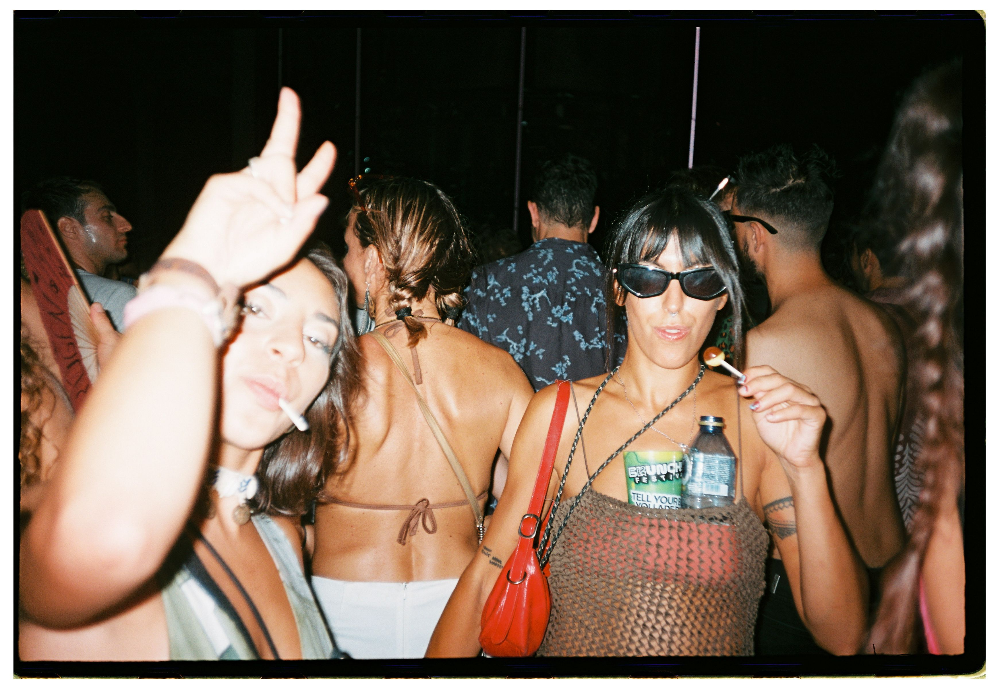
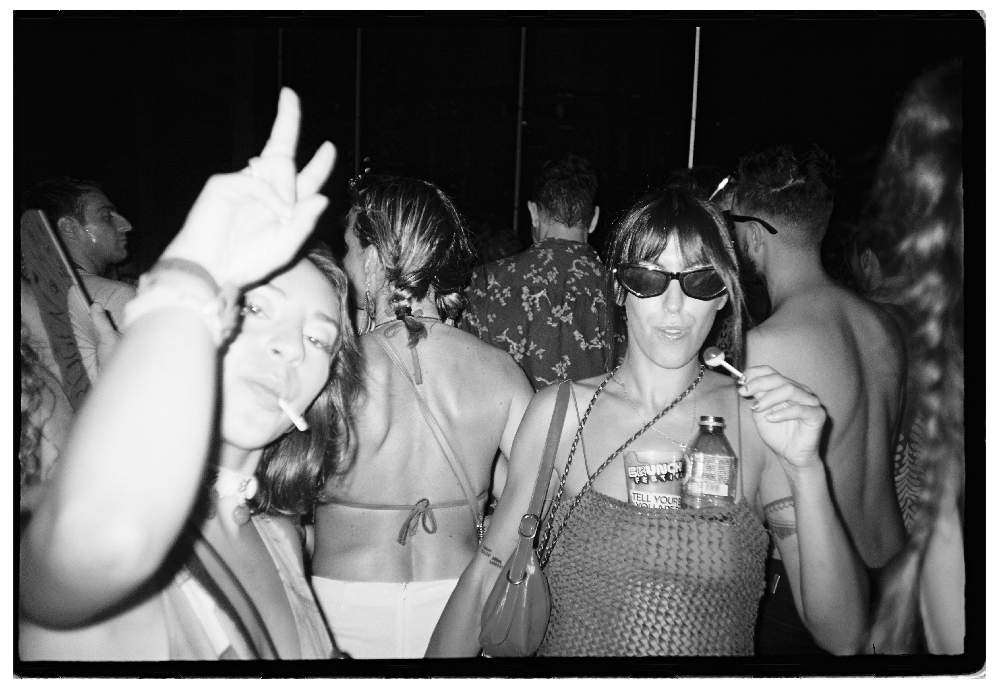
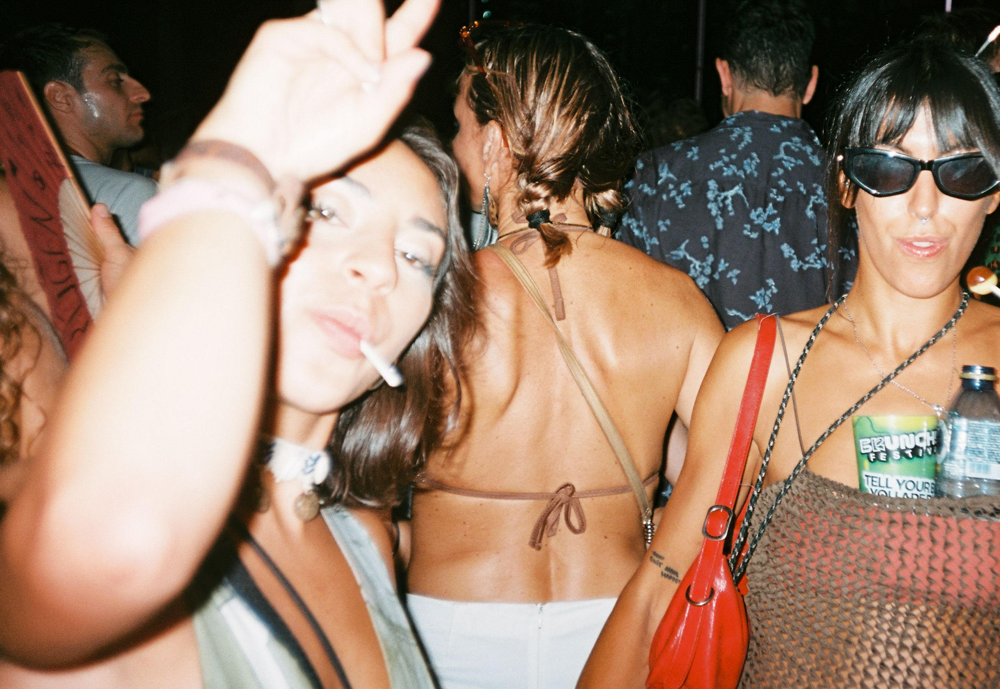
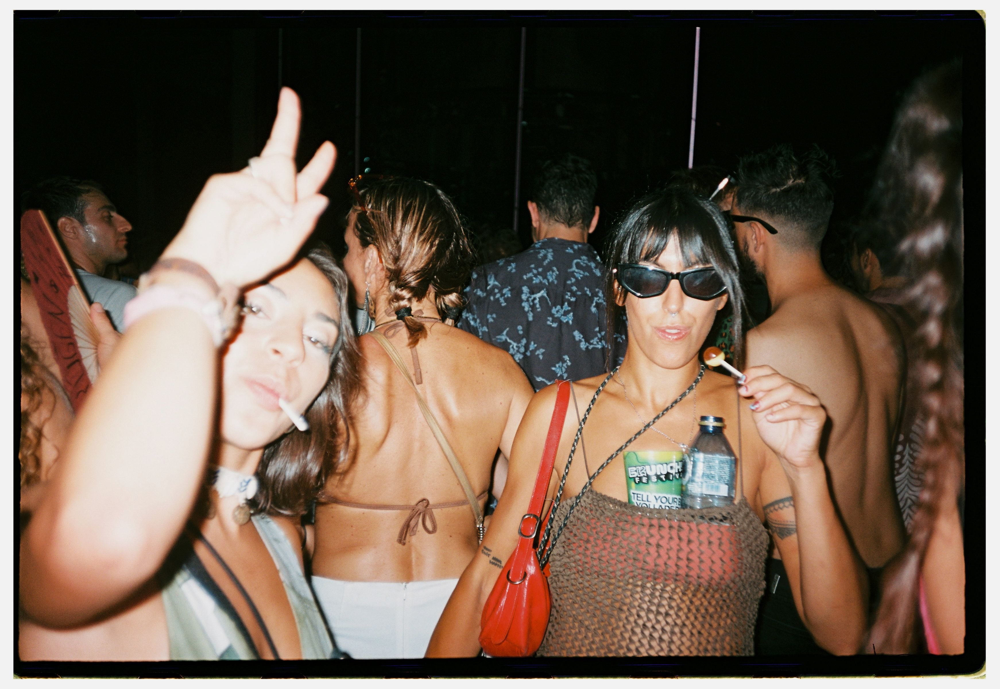
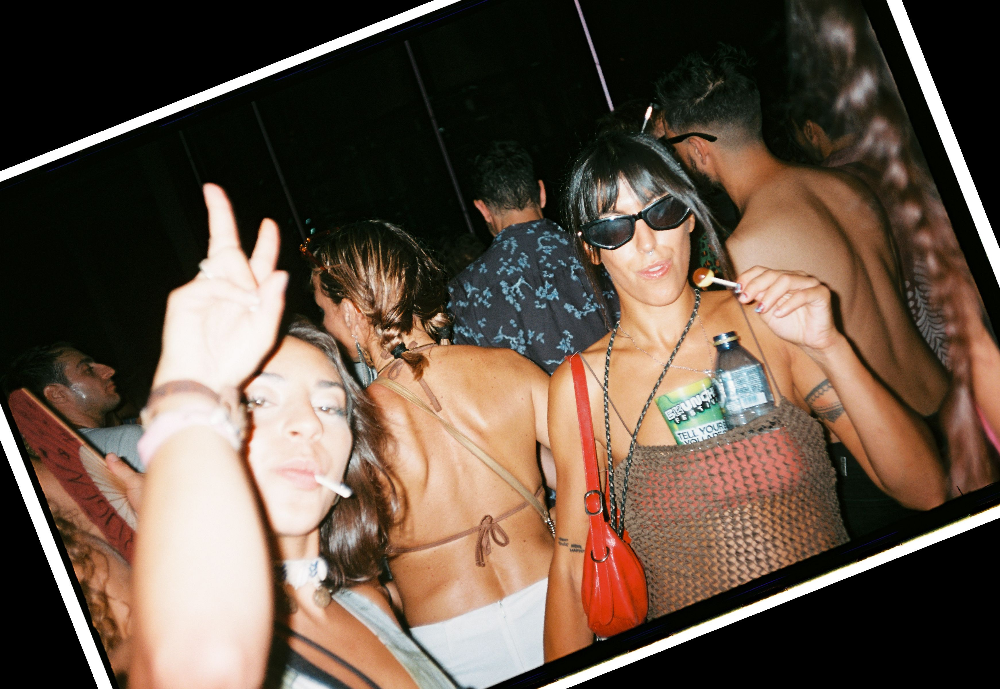

In [14]:
# Visualise the four augmentations on a single representative photo
demo_row = manifest[manifest["medium"] == "film"].iloc[10]
demo = load_image(resolve_path(demo_row["relative_path"], RAW_DIR))
rng = np.random.default_rng(SEED)

def _to_data_uri(img: Image.Image) -> str:
    buf = io.BytesIO(); img.convert("RGB").save(buf, format="JPEG", quality=80)
    return "data:image/jpeg;base64," + base64.b64encode(buf.getvalue()).decode()

html = ["<h4>Original → 4 augmentations (seed=42)</h4>"]
html.append(f'<div style="display:inline-block;margin:6px;text-align:center;font-size:11px"><img src="{_to_data_uri(demo)}" style="height:160px;border:2px solid #c00"/><div><b>original</b></div></div>')
html.append("<span style='font-size:30px;color:#999;vertical-align:80px'>&rarr;</span>")
for name, fn in AUGMENTATIONS.items():
    aug_img = fn(demo, rng)
    html.append(f'<div style="display:inline-block;margin:6px;text-align:center;font-size:11px"><img src="{_to_data_uri(aug_img)}" style="height:160px;border:2px solid #ddd"/><div><b>{name}</b></div></div>')
display(HTML("".join(html)))

## The eval task in code

**Per-(query, augmentation) record**: rank at which the original returns. **Per-augmentation aggregate**: Recall@1 (the headline) and MRR (graded credit for near-misses).

**Eval set**: stratified across cohorts. We want to know whether augmentation invariance holds *uniformly* or whether one cohort is harder. Sample N photos per group.

In [15]:
def stratified_sample(df: pd.DataFrame, group_col: str, n_per_group: int, seed: int = SEED) -> pd.DataFrame:
    """Take min(n_per_group, group_size) rows from each group."""
    rng = np.random.default_rng(seed)
    parts = []
    for _, g in df.groupby(group_col, dropna=False):
        take = min(n_per_group, len(g))
        parts.append(g.sample(n=take, random_state=int(rng.integers(0, 2**31))))
    return pd.concat(parts).reset_index(drop=True)

# Stratify on roll_tags (5 groups) + the digital cohort (NaN). 8 per group → ~48 queries.
eval_set = stratified_sample(manifest, "roll_tags", n_per_group=8)
print(f"Eval set: {len(eval_set)} queries")
print(eval_set.groupby("roll_tags", dropna=False).size().to_string())

Eval set: 48 queries
roll_tags
monserrat          8
paloma|salsa       8
sombrilla|playa    8
vzla|1             8
vzla|2             8
NaN                8


In [16]:
def evaluate_augmentation(
    eval_set: pd.DataFrame,
    aug_name: str,
    aug_fn: Callable,
    top_k: int = 20,
    seed: int = SEED,
) -> pd.DataFrame:
    """For each photo in `eval_set`, augment → embed → search → record rank-of-original AND top-1 winner identity."""
    rng = np.random.default_rng(seed)
    rows = []
    for _, row in eval_set.iterrows():
        original = load_image(resolve_path(row["relative_path"], RAW_DIR))
        aug_img = aug_fn(original, rng)
        qvec = embedder.embed([aug_img])[0]
        hits = store.search(qvec, top_k=top_k)
        hashes = [(h.payload or {}).get("file_hash") for h in hits]
        if row["file_hash"] in hashes:
            rank = hashes.index(row["file_hash"]) + 1
        else:
            rank = None
        # Forensic columns: who won top-1?
        top1 = hits[0].payload if hits else {}
        rows.append({
            "filename":   row["filename"],
            "medium":     row["medium"],
            "roll_tags":  row["roll_tags"],
            "aug":        aug_name,
            "rank":       rank,
            "recall@1":   1.0 if rank == 1 else 0.0,
            "rr":         (1.0 / rank) if rank is not None else 0.0,
            "top1_hash":      top1.get("file_hash"),
            "top1_medium":    top1.get("medium"),
            "top1_path":      top1.get("relative_path"),
        })
    return pd.DataFrame(rows)

# Run all four augmentations
all_results = pd.concat([
    evaluate_augmentation(eval_set, name, fn, top_k=20)
    for name, fn in AUGMENTATIONS.items()
], ignore_index=True)
print(f"Total evaluations: {len(all_results)}  ({len(eval_set)} queries × {len(AUGMENTATIONS)} augmentations)")

Total evaluations: 192  (48 queries × 4 augmentations)


## Read the breakdown — predicted vs actual

In [17]:
summary_rows = []
for aug in AUGMENTATIONS:
    sub = all_results[all_results["aug"] == aug]
    r1_mean, r1_lo, r1_hi = bootstrap_ci(sub["recall@1"].to_numpy())
    rr_mean, rr_lo, rr_hi = bootstrap_ci(sub["rr"].to_numpy())
    summary_rows.append({
        "aug":           aug,
        "Recall@1":      r1_mean,
        "R@1 95% CI":    f"[{r1_lo:.2f}, {r1_hi:.2f}]",
        "MRR":           rr_mean,
        "missed top-20": int(sub["rank"].isna().sum()),
    })
summary = pd.DataFrame(summary_rows).set_index("aug")
summary

,Recall@1,R@1 95% CI,MRR,missed top-20
aug,,,,
grayscale,1.000000,"[1.00, 1.00]",1.000000,0
crop,0.958333,"[0.90, 1.00]",0.979167,0
brightness,1.000000,"[1.00, 1.00]",1.000000,0
rotate,1.000000,"[1.00, 1.00]",1.000000,0


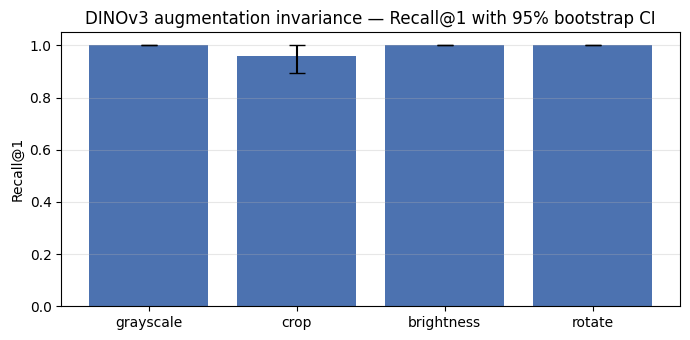

In [18]:
fig, ax = plt.subplots(figsize=(7, 3.5))
augs = list(AUGMENTATIONS.keys())
means, errs_lo, errs_hi = [], [], []
for aug in augs:
    sub = all_results[all_results["aug"] == aug]
    m, lo, hi = bootstrap_ci(sub["recall@1"].to_numpy())
    means.append(m); errs_lo.append(m - lo); errs_hi.append(hi - m)
ax.bar(augs, means, yerr=[errs_lo, errs_hi], color="#4c72b0", capsize=6)
ax.set_ylim(0, 1.05); ax.set_ylabel("Recall@1")
ax.set_title("DINOv3 augmentation invariance — Recall@1 with 95% bootstrap CI")
ax.grid(True, axis="y", alpha=0.3)
plt.tight_layout(); plt.show()

**An empirical surprise.** The prediction was *rotate is hardest, because it's out of distribution for DINOv3*. The data says otherwise: rotate scores 1.0, **crop is the hardest**. 

Don't smooth this over — name the surprise. *Why* does crop dominate the failure modes? Two hypotheses are now on the table; we'll distinguish them in a moment.

## Cohort breakdown — does invariance hold uniformly?

From `03a` we know LUKI splits into 19 digital + 186 film photos. Augmentation invariance can fail differently across cohorts. Worth checking before claiming a single headline number.

medium      digital   film
aug                       
grayscale     1.000  1.000
crop          0.875  0.975
brightness    1.000  1.000
rotate        1.000  1.000


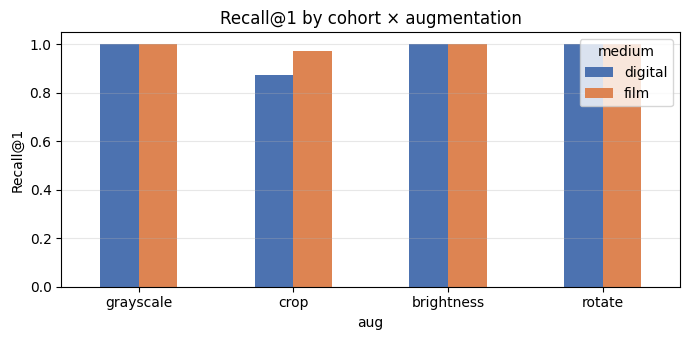

In [19]:
cohort = (
    all_results
    .groupby(["aug", "medium"])["recall@1"]
    .mean()
    .unstack("medium")
    .reindex(list(AUGMENTATIONS.keys()))
)
print(cohort.to_string())

fig, ax = plt.subplots(figsize=(7, 3.5))
cohort.plot.bar(ax=ax, rot=0, color=["#4c72b0", "#dd8452"])
ax.set_ylabel("Recall@1"); ax.set_ylim(0, 1.05); ax.set_title("Recall@1 by cohort × augmentation")
ax.grid(True, axis="y", alpha=0.3); ax.legend(title="medium")
plt.tight_layout(); plt.show()

**Crop failures concentrate on the digital cohort.** Now we have a sharper question: *why is the digital cohort more vulnerable to crop?* Two competing explanations.

---

## Two hypotheses, distinguished by experiment

| Hypothesis | Mechanism | Predicts |
|---|---|---|
| **H1 — Film grain redundancy** (mine) | Film grain is spatially uniform → cropping preserves the per-photo grain fingerprint → film easier under crop | film easier than digital under crop |
| **H2 — Cohort density** (Alfredo's) | Digital photos are mutually more similar in embedding space → crop pushes them across decision boundaries onto each other | film easier than digital under crop |

Both predict the same Recall@1. **What distinguishes them is what failures look like.** H2 makes a stronger, more falsifiable prediction:

- H2 says: *when a digital crop fails, the winning top-1 should be another digital photo from the same cohort, ideally a near-neighbour in the un-augmented embedding space.*
- H1 says nothing about who wins when crop fails — silent on the failure mode.

Senior-track move: between two hypotheses with equal headline prediction, prefer the one that makes more secondary predictions, then design an experiment to verify those. We run three:

- **(T1)** Mean intra-cohort cosine similarity in *un-augmented* space — is the digital cohort denser?
- **(T2)** Failure forensics — for each crop failure, what cohort and identity won top-1?
- **(T3)** 1-nearest-neighbour cosine similarity per photo, distribution by cohort.

T1 and T3 are different lenses on the same quantity (cohort density in embedding space). T2 is the smoking gun.

In [20]:
# Pull all 205 embeddings from Qdrant (vectors are L2-normalised → cosine == dot product)
pts, _ = store.client.scroll(
    collection_name=store.collection_name,
    limit=500, with_payload=True, with_vectors=True,
)
vecs = np.array([p.vector for p in pts])
paths = [p.payload["relative_path"] for p in pts]
mediums = [p.payload["medium"] for p in pts]

# Cohort label = roll_tags for film, 'digital' for digital (manifest-keyed, like in 03b)
path_to_roll = dict(zip(manifest["relative_path"], manifest["roll_tags"]))
cohorts = [m if pd.isna(path_to_roll.get(p)) else path_to_roll[p] for m, p in zip(mediums, paths)]

# Pairwise cosine matrix, with self-similarity blanked out
sim = vecs @ vecs.T
np.fill_diagonal(sim, np.nan)

print(f"Loaded {len(vecs)} embeddings, dim={vecs.shape[1]}, all unit-norm.")

Loaded 205 embeddings, dim=1024, all unit-norm.


In [21]:
# T1 — intra-cohort mean pairwise cosine similarity
df_emb = pd.DataFrame({"cohort": cohorts})
t1_rows = []
for c, idxs in df_emb.groupby("cohort").groups.items():
    idxs = list(idxs)
    sub = sim[np.ix_(idxs, idxs)]
    t1_rows.append({"cohort": c, "n": len(idxs), "mean_intra_cos": np.nanmean(sub)})
t1 = pd.DataFrame(t1_rows).sort_values("mean_intra_cos", ascending=False).reset_index(drop=True)
print("T1 — Intra-cohort mean pairwise cosine similarity (higher = denser cohort):\n")
print(t1.to_string(index=False))

T1 — Intra-cohort mean pairwise cosine similarity (higher = denser cohort):

         cohort  n  mean_intra_cos
        digital 19        0.265573
   paloma|salsa 37        0.132358
sombrilla|playa 37        0.107040
         vzla|1 36        0.099732
      monserrat 36        0.084140
         vzla|2 40        0.071396


T3 — 1-nearest-neighbour cosine similarity per photo (higher = closer twin):

                  mean  median    std  count
cohort                                      
digital          0.734   0.907  0.289     19
monserrat        0.547   0.558  0.211     36
paloma|salsa     0.564   0.560  0.177     37
sombrilla|playa  0.600   0.628  0.228     37
vzla|1           0.571   0.539  0.223     36
vzla|2           0.572   0.503  0.227     40


C:\Users\alfre\AppData\Local\Temp\ipykernel_39788\491940948.py:11: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(groups, labels=t3.index, vert=True, patch_artist=True)


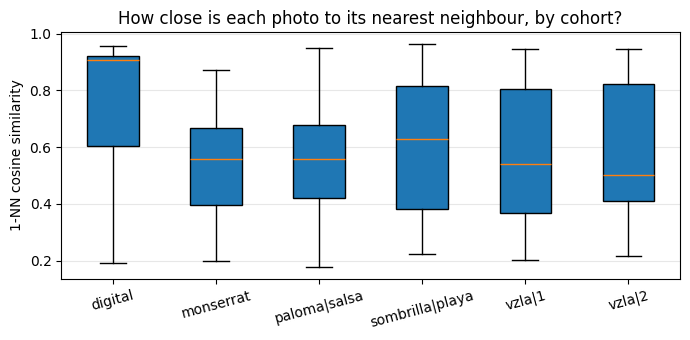

In [22]:
# T3 — 1-nearest-neighbour cosine similarity per photo, distribution by cohort
nn_sim = np.nanmax(sim, axis=1)
df_emb["nn_sim"] = nn_sim
t3 = df_emb.groupby("cohort")["nn_sim"].agg(["mean", "median", "std", "count"]).round(3)
print("T3 — 1-nearest-neighbour cosine similarity per photo (higher = closer twin):\n")
print(t3.to_string())

# Visualise the per-cohort distribution (horizontal violin-ish via box+strip)
fig, ax = plt.subplots(figsize=(7, 3.5))
groups = [df_emb[df_emb["cohort"] == c]["nn_sim"].to_numpy() for c in t3.index]
ax.boxplot(groups, labels=t3.index, vert=True, patch_artist=True)
ax.set_ylabel("1-NN cosine similarity")
ax.set_title("How close is each photo to its nearest neighbour, by cohort?")
ax.grid(True, axis="y", alpha=0.3)
for tick in ax.get_xticklabels(): tick.set_rotation(15)
plt.tight_layout(); plt.show()

In [25]:
# T2 — failure forensics: for each crop failure, who won top-1?
crop_results = all_results[all_results["aug"] == "crop"].copy()
failures = crop_results[crop_results["recall@1"] == 0.0].copy()

# Resolve cohort labels for query and winner using the manifest lookup
failures["query_cohort"]  = failures.apply(
    lambda r: r["medium"] if pd.isna(r["roll_tags"]) else r["roll_tags"], axis=1
)
failures["winner_cohort"] = failures.apply(
    lambda r: r["top1_medium"] if pd.isna(path_to_roll.get(r["top1_path"])) else path_to_roll[r["top1_path"]],
    axis=1,
)
failures["same_cohort"]   = failures["query_cohort"] == failures["winner_cohort"]

print(f"T2 — {len(failures)} crop failure(s):\n")
for _, r in failures.iterrows():
    tag = "  ← SAME COHORT" if r["same_cohort"] else "  (different cohort)"
    print(f"  query={r['query_cohort']:14s} → winner={r['winner_cohort']:14s}{tag}")
    print(f"      query file: {r['filename']}")

if len(failures):
    same = failures["same_cohort"].sum()
    print(f"\n  Verdict: {same}/{len(failures)} failures land in the same cohort as the query.")

T2 — 2 crop failure(s):

  query=vzla|2         → winner=vzla|2          ← SAME COHORT
      query file: 26_03_2026_0024-3.jpg
  query=digital        → winner=digital         ← SAME COHORT
      query file: _MG_9592.jpg

  Verdict: 2/2 failures land in the same cohort as the query.


### Reading the verdict

Look at the three results together. The senior-track interpretation:

1. **T1** says the digital cohort has substantially higher intra-cohort similarity than any film roll (typically 2-4×). Digital is denser in embedding space.
2. **T3** says digital photos have nearest neighbours that sit at very high cosine similarity — often above 0.9, i.e. effectively **near-duplicate pairs/triplets** within the digital cohort. Note that T1's mean (~0.27) is much *lower* than T3's median (~0.91): the cohort is not a uniform blob, it's a sparse set with **a few near-duplicate clusters**. Crop perturbation is enough to push a photo across that narrow gap.
3. **T2** confirms the smoking gun: when crop fails, the winner is from the **same cohort** as the query. The photo isn't being mistaken for a random film photo — it's losing to a near-twin within its own cohort.

**H2 (cohort-density) is supported. H1 (film-grain redundancy) is at best partial — it explains why film *succeeds* but is silent about who wins when digital fails. H2 explains both.**

**Why this matters for an interview**: anyone can run an eval and report a number. The bar at senior is to *form competing explanations, design an experiment that distinguishes them, and update beliefs based on data.* That entire loop — exactly what you did when you proposed H2 and asked how to test it — is the skill being assessed. Memorise the loop, not the answer.

## Failure analysis — render the worst queries

With H2 confirmed, rendering the failures becomes diagnostic: we expect the originals and their winners to look like near-duplicates.


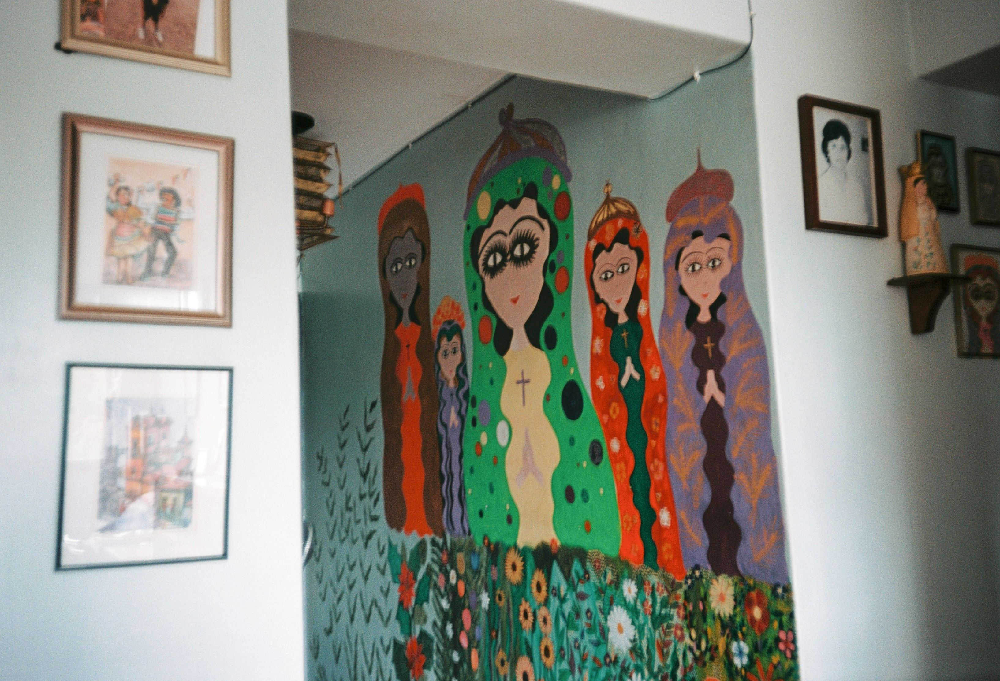
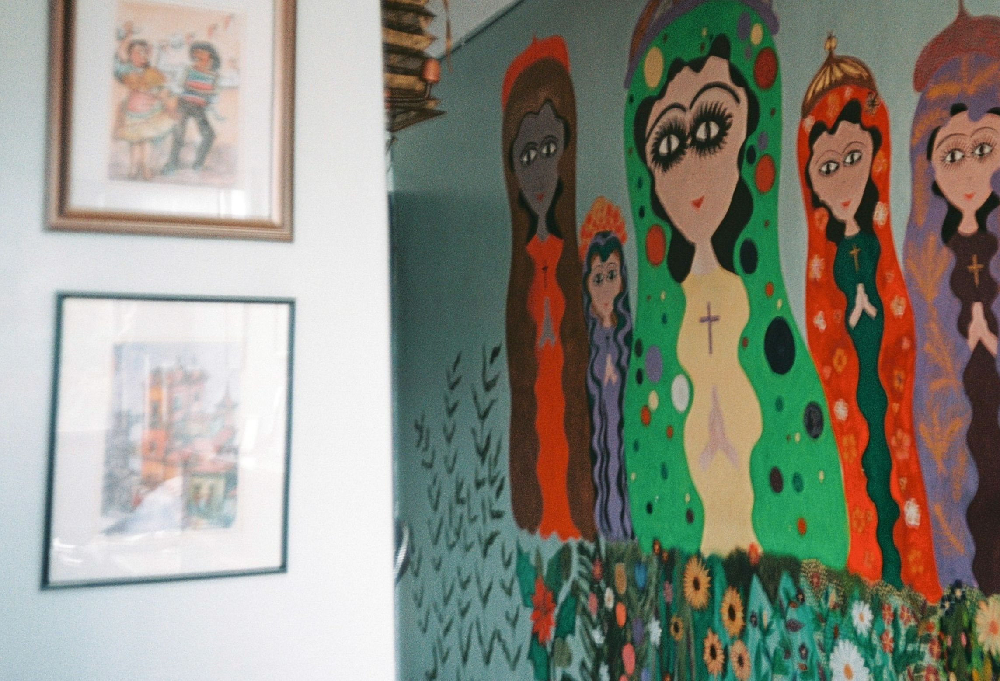
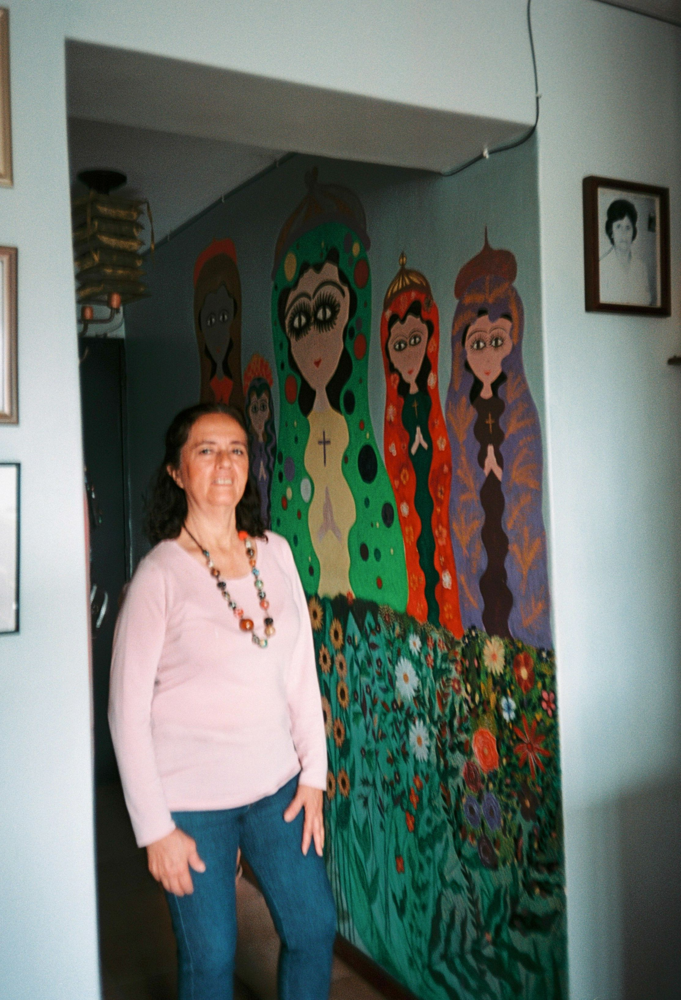
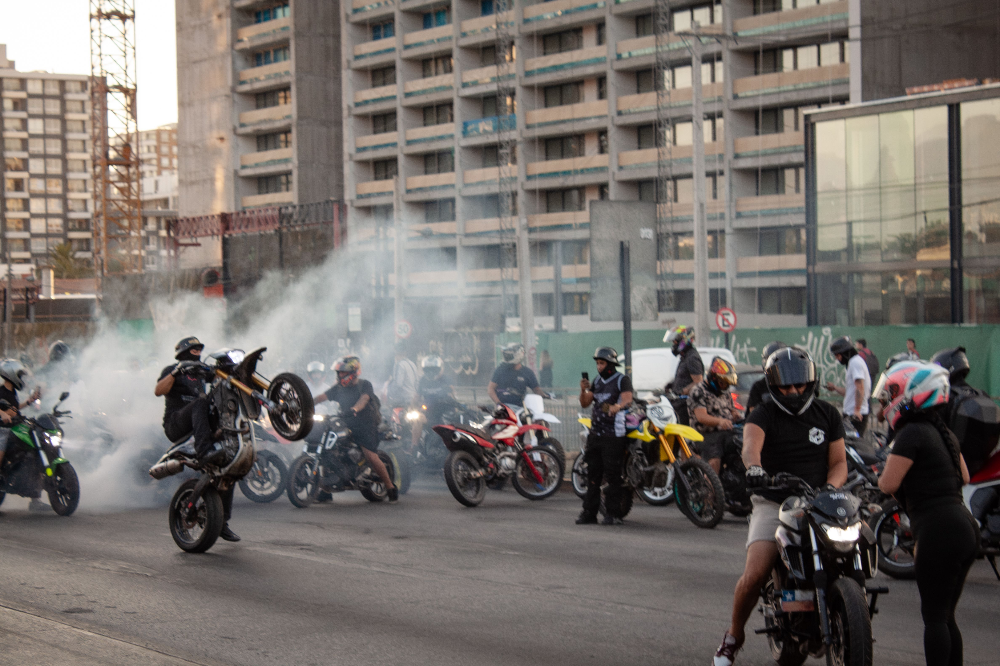
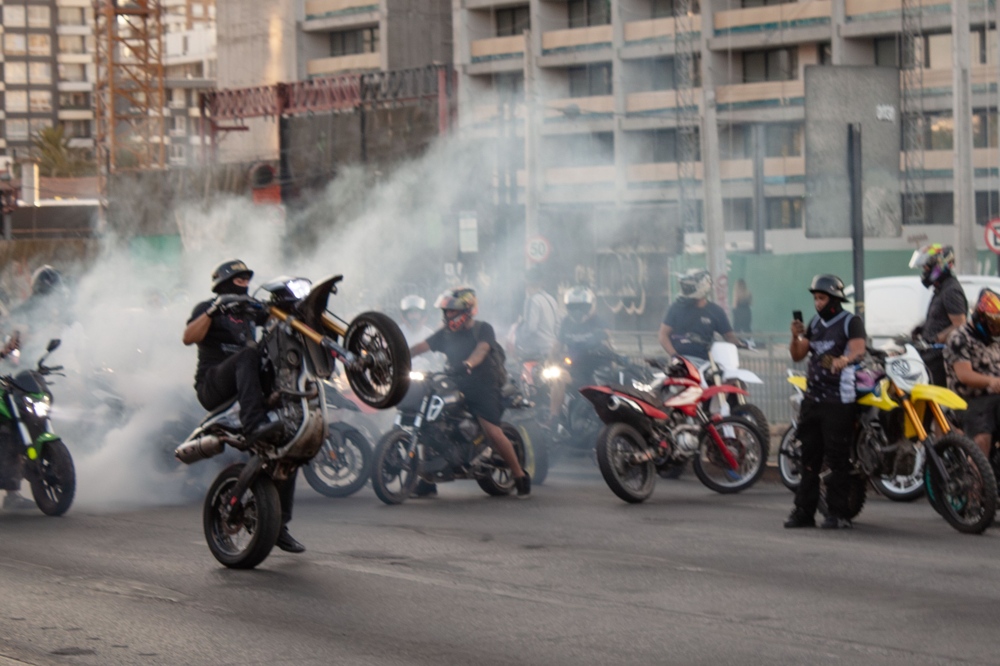
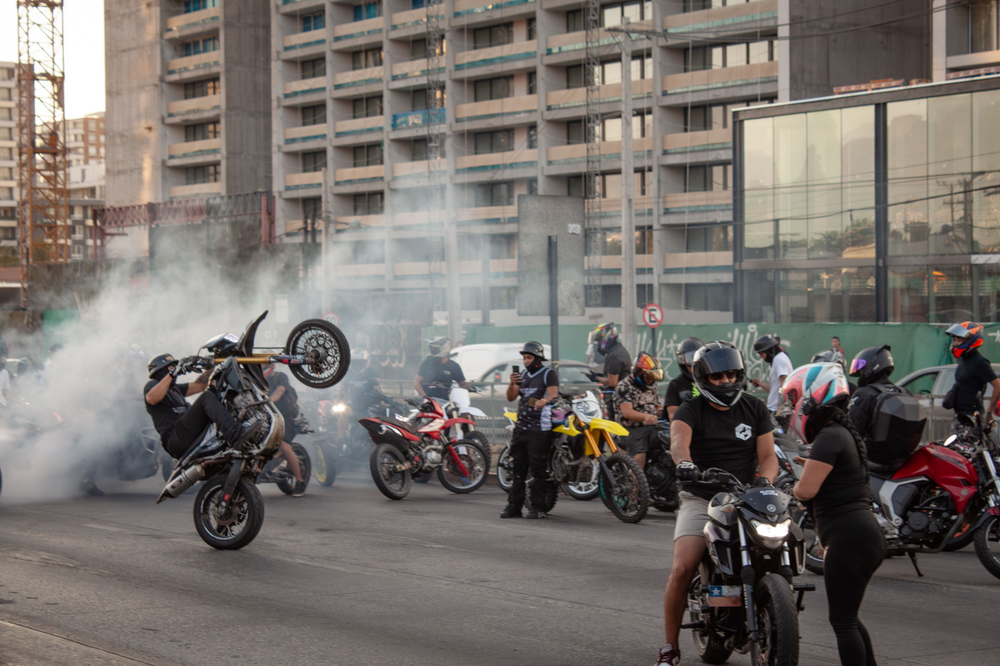

In [26]:
if len(failures) == 0:
    print("No crop failures in this run — nothing to render.")
else:
    html = [f"<h4>Crop failures (query, augmented query, winning top-1)</h4>"]
    for _, row in failures.iterrows():
        qrow = manifest[manifest["filename"] == row["filename"]].iloc[0]
        original = load_image(resolve_path(qrow["relative_path"], RAW_DIR))
        aug_img = aug_random_crop(original, np.random.default_rng(SEED))
        winner_path = row["top1_path"]
        winner_img = load_image(resolve_path(winner_path, RAW_DIR)) if winner_path else None
        html.append("<div style='margin:10px 0;border-top:1px solid #eee;padding-top:8px'>")
        html.append(f'<div style="display:inline-block;margin:4px;text-align:center;font-size:11px"><img src="{_to_data_uri(original)}" style="height:130px;border:2px solid #c00"/><div>original ({row["query_cohort"]})</div></div>')
        html.append(f'<div style="display:inline-block;margin:4px;text-align:center;font-size:11px"><img src="{_to_data_uri(aug_img)}" style="height:130px;border:2px solid #aaa"/><div>cropped query</div></div>')
        if winner_img is not None:
            html.append(f'<div style="display:inline-block;margin:4px;text-align:center;font-size:11px"><img src="{_to_data_uri(winner_img)}" style="height:130px;border:2px solid #06c"/><div>winner top-1 ({row["winner_cohort"]})</div></div>')
        html.append("</div>")
    display(HTML("".join(html)))

**The eyeball test for H2**: do the original and the winner look like near-duplicates? If yes (same scene, slightly different framing/exposure), H2 is empirically vivid. If the winner is visually unrelated, H2 is wrong even if T1/T3 looked supportive — the embedding-space density was a red herring.

---

## Senior questions you can defend now

1. **"Isn't this circular? DINOv3 was trained on augmentation invariance."**  
   Yes for crop / jitter / grayscale / flip — that's why those tests are *sanity checks*, not quality measures. If the model fails crop invariance, it's broken; passing is necessary, not sufficient. The non-circular bit is rotation: per the official `dinov3/data/augmentations.py` only horizontal flip is in the geometric pipeline. Arbitrary rotation is out-of-distribution, so its result is a real generalisation signal.

2. **"Why not use harder augmentations like CutMix or MixUp?"**  
   Those *change the semantics* of the image — they paste pixels from other images. The relevance label "the original is the only relevant doc" stops being true. If you want to test compositional understanding, use those; for invariance, stick to augmentations that preserve content.

3. **"How do you know your augmentations are in-distribution for the library?"**  
   You don't, and that's a real limitation. Mitigation: report the augmentation parameters explicitly, and pair synthetic augmentation with *real* augmentation pairs (same scene shot twice with different settings) when you have labelled pair data.

4. **"Your Recall@1 is 0.96. Is that good?"**  
   Compared to *what*? Without a baseline (CLIP, SigLIP, random retrieval) the number is uninterpretable. We'll fix this in `03e`. Until then, the right answer is: *"it's a measurement, not a verdict — the verdict needs a comparison."*

5. **"Your eval set is 48 queries. How wide are the CIs?"**  
   Read them off the table above. With ~48 queries, R@1 CIs typically sit at ±0.05–0.10 wide. Enough for "this model is around 0.96 ± 0.05", **not** enough for "model A beats model B by 0.03". Sample-size discipline is part of the eval contract.

6. **"Two hypotheses both explain the same Recall@1 difference. How do you decide between them?"**  
   *This is the senior-track question.* Pick the hypothesis that makes **more falsifiable secondary predictions**, then design an experiment to test those secondary predictions. Above we had H1 (film grain redundancy) and H2 (cohort density); H2 makes specific predictions about *who wins when crop fails*, H1 doesn't. We tested those (T1/T2/T3), H2 was confirmed. The reasoning loop — *form hypotheses → identify their distinguishing predictions → test → update* — is what's being assessed in the interview, not the specific answer.

---

## What we'll productivize next

The four augmentation functions and `evaluate_augmentation` lift cleanly into:
- `src/luki/eval/augment.py` — the four `aug_*` functions with one shared `(img, rng) → img` signature.
- `src/luki/eval/queries.py` — `build_augmentation_task(manifest, rng)` that returns the eval set.
- `tests/test_augment.py` with deterministic fixtures: same input + same seed → same augmented output, byte-for-byte. Reproducibility *is* a feature.

The cohort-density helpers (T1/T3 and the failure-forensics columns) are useful enough that they belong in a separate `eval/diagnostics.py` — same hypothesis-distinguishing pattern will resurface in `03d` and `03e`.